# Running BESS for an ECOSTRESS Scene

This is an example of running the artificial neural network emulator of the Breathing Earth Systems Simulator (BESS) corresponding to an ECOsystem Spaceborne Thermal Radiometer Experiment on Space Station (ECOSTRESS) scene.

In [1]:
from os.path import join
from datetime import datetime, date, time
from dateutil import parser
import rasters as rt
from geos5fp import GEOS5FP
from koppengeiger import load_koppen_geiger
from solar_apparent_time import UTC_to_solar
import sun_angles
from gedi_canopy_height import GEDICanopyHeight
from modisci import load_clumping_index
from FLiESANN import process_FLiES
from BESS import load_NDVI_minimum
from BESS import load_NDVI_maximum
from BESS import load_C4_fraction
from BESS import process_BESS_latlon
from BESS import load_carbon_uptake_efficiency
from BESS import load_kn
from BESS import load_peakVCmax_C3
from BESS import load_peakVCmax_C4
from BESS import load_ball_berry_intercept_C3
from BESS import load_ball_berry_slope_C3
from BESS import load_ball_berry_slope_C4
from BESS import BALL_BERRY_INTERCEPT_C4
from matplotlib.colors import LinearSegmentedColormap
import logging
logging.disable(logging.CRITICAL)

Here's an example ECOSTRESS surface temperature scene.

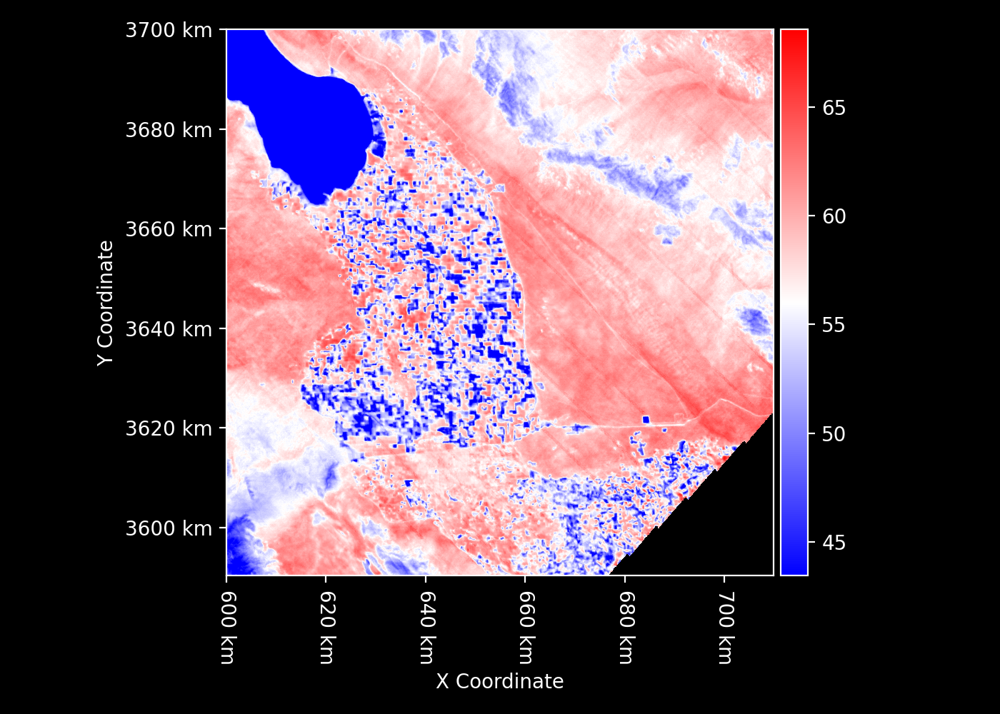

In [2]:
ST_filename = "ECOv002_L2T_LSTE_34366_004_11SPS_20240728T204025_0712_01_LST.tif"
ST_cmap = "bwr"
ST_C = rt.Raster.open(ST_filename, cmap=ST_cmap) - 273.15
ST_C

Let's get the acquisition time of the scene.

In [3]:
time_UTC = parser.parse(ST_filename.split("_")[6])
longitude = ST_C.geometry.centroid_latlon.x
latitude = ST_C.geometry.centroid_latlon.y
time_solar = UTC_to_solar(time_UTC, longitude)
doy_solar = time_solar.timetuple().tm_yday
hour_of_day_solar = time_solar.hour + time_solar.minute / 60 + time_solar.second / 3600
print(f"{time_UTC:%Y-%m-%d %H:%M:%S} UTC")
print(f"{time_solar:%Y-%m-%d %H:%M:%S} solar apparent time at longitude {longitude}")
print(f"day of year {doy_solar} at longitude {longitude}")
print(f"hour of day {hour_of_day_solar} at longitude {longitude}")

2024-07-28 20:40:25 UTC
2024-07-28 12:59:02 solar apparent time at longitude -115.3433725031462
day of year 210 at longitude -115.3433725031462
hour of day 12.983888888888888 at longitude -115.3433725031462


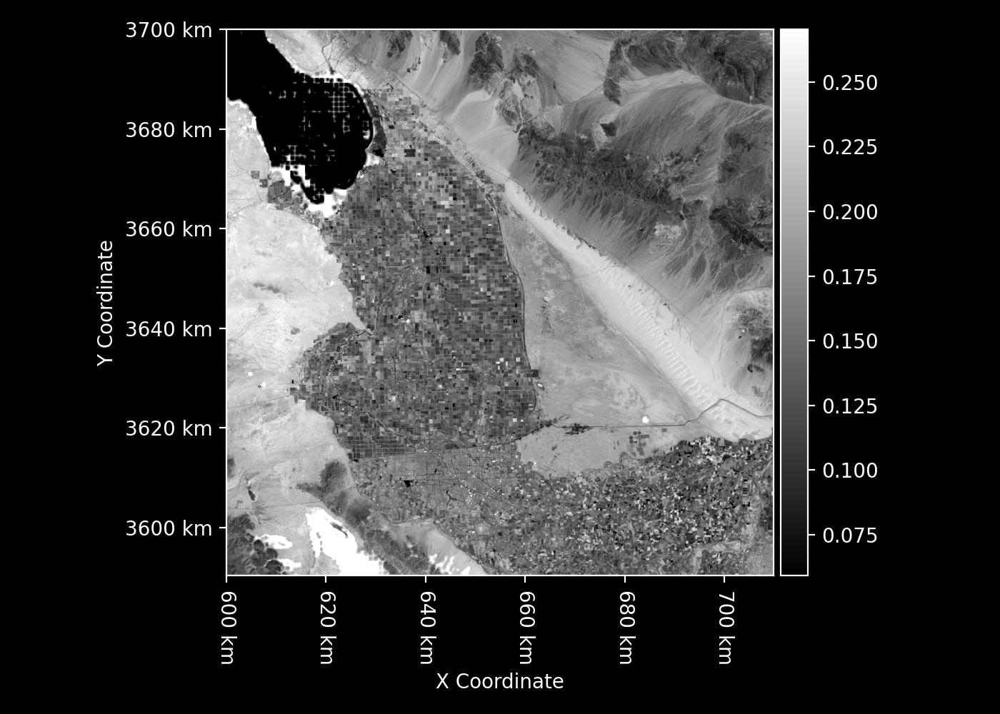

In [4]:
albedo_filename = "ECOv002_L2T_STARS_11SPS_20240728_0712_01_albedo.tif"
albedo_cmap = LinearSegmentedColormap.from_list(name="albedo", colors=["black", "white"])
albedo = rt.Raster.open(albedo_filename, cmap=albedo_cmap)
albedo

We'll use the `geos5fp` package to generate rasters of aerosol optical thickness (AOT) and cloud optical thickness (COT).

In [5]:
geos5fp = GEOS5FP(working_directory=join("~", "data", "GEOS5FP"))

Download AOT from GEOS-5 FP.

In [6]:
%%capture
AOT = geos5fp.AOT(time_UTC=time_UTC, geometry=ST_C.geometry)

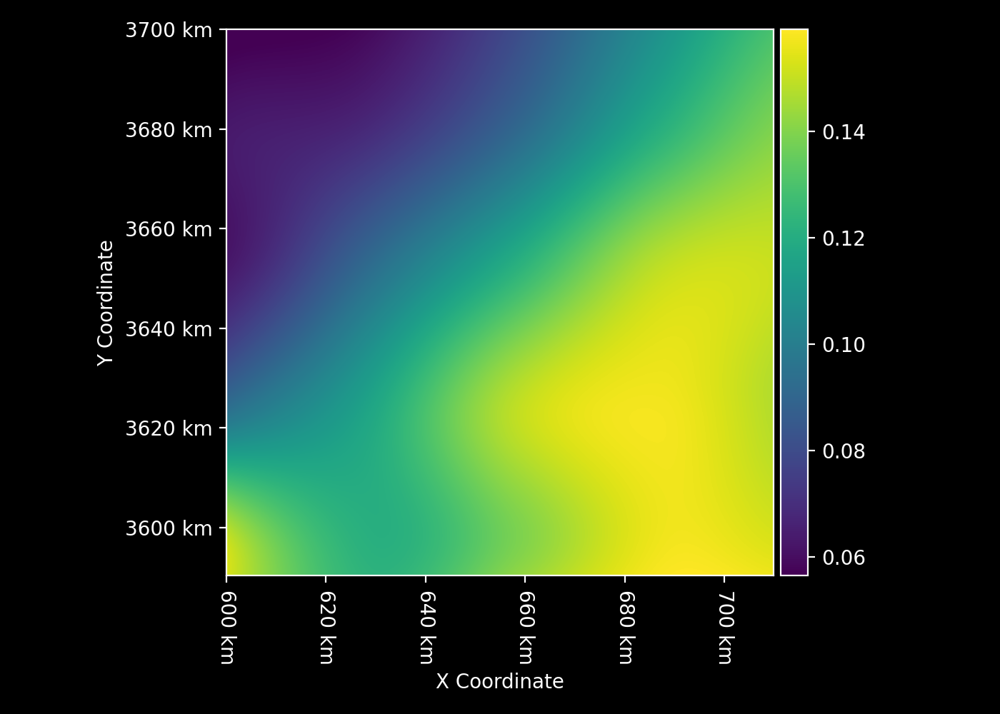

In [7]:
AOT.cmap = "viridis"
AOT

Download COT from GEOS-5 FP.

In [8]:
%%capture
COT = geos5fp.COT(time_UTC=time_UTC, geometry=ST_C.geometry)

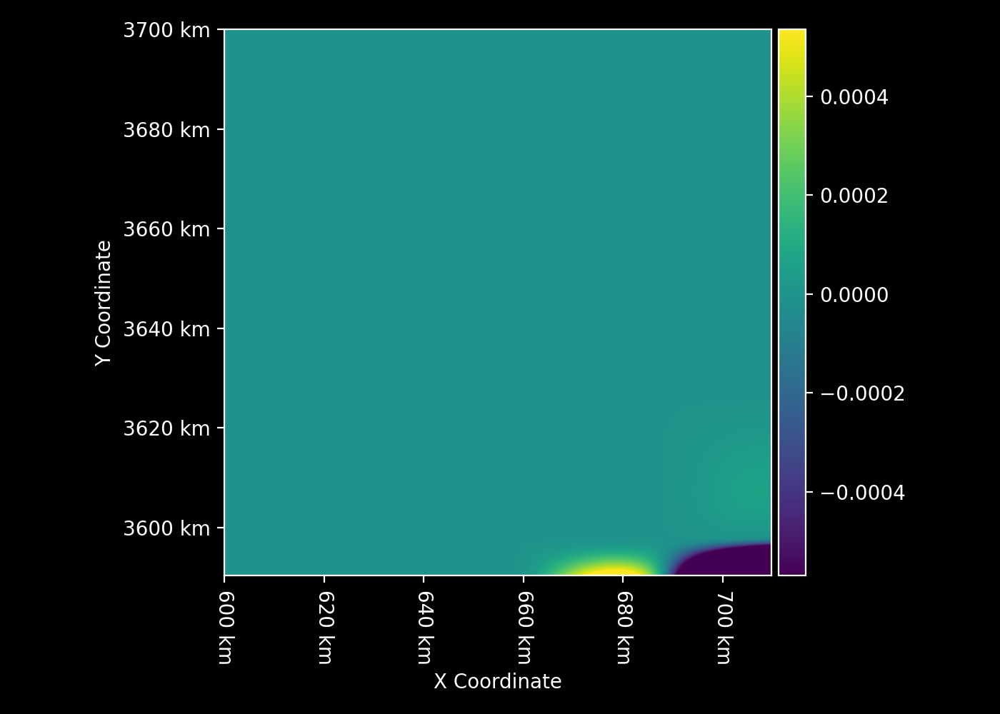

In [9]:
COT.cmap = "viridis"
COT

Download total column water vapor (vapor_gccm) in grams per square centimeter from GEOS-5 FP.

In [10]:
%%capture
vapor_gccm = geos5fp.vapor_gccm(time_UTC=time_UTC, geometry=ST_C.geometry)

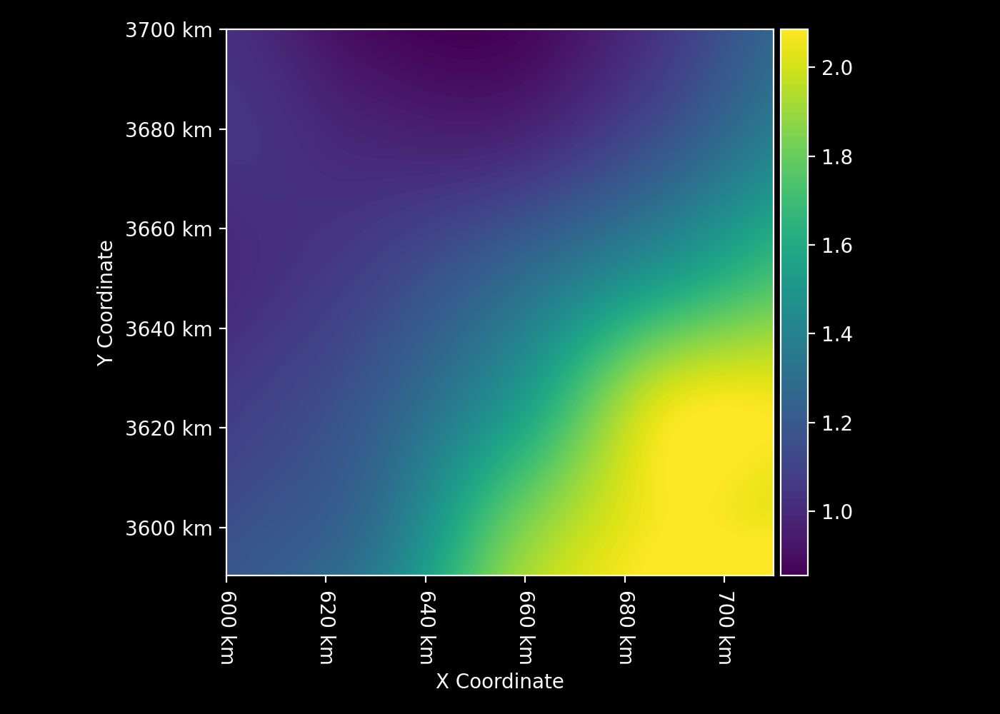

In [11]:
vapor_gccm.cmap = "viridis"
vapor_gccm

Download total column ozone (ozone_cm) in centimeters from GEOS-5 FP.

In [12]:
%%capture
ozone_cm = geos5fp.ozone_cm(time_UTC=time_UTC, geometry=ST_C.geometry)

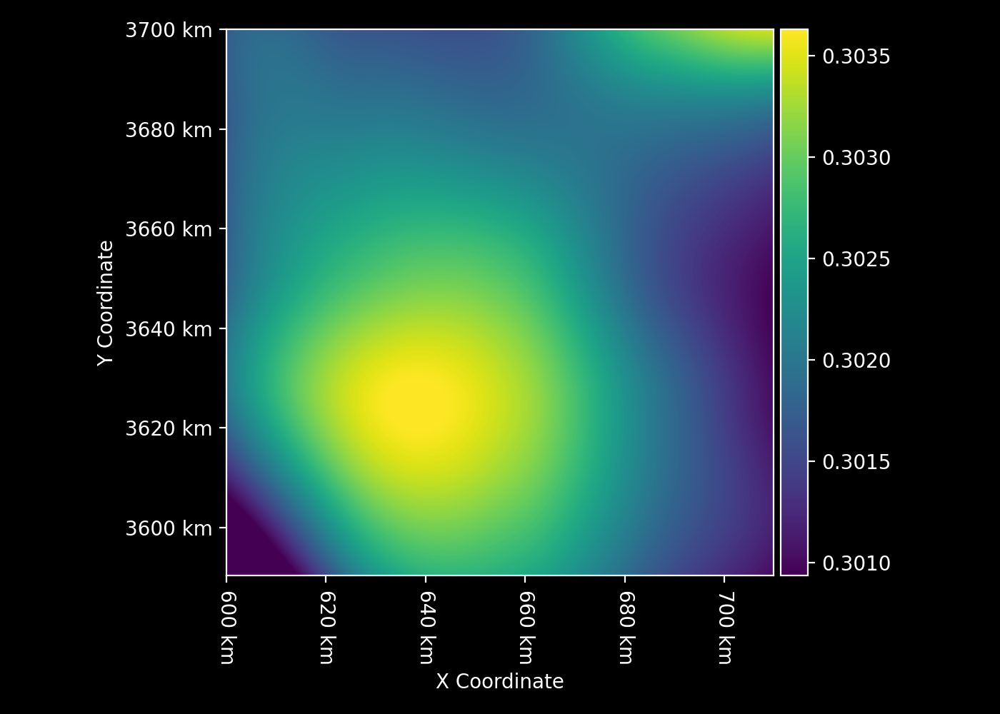

In [13]:
ozone_cm.cmap = "viridis"
ozone_cm

Load the Köppen–Geiger climate classification from the `koppengeiger` package.

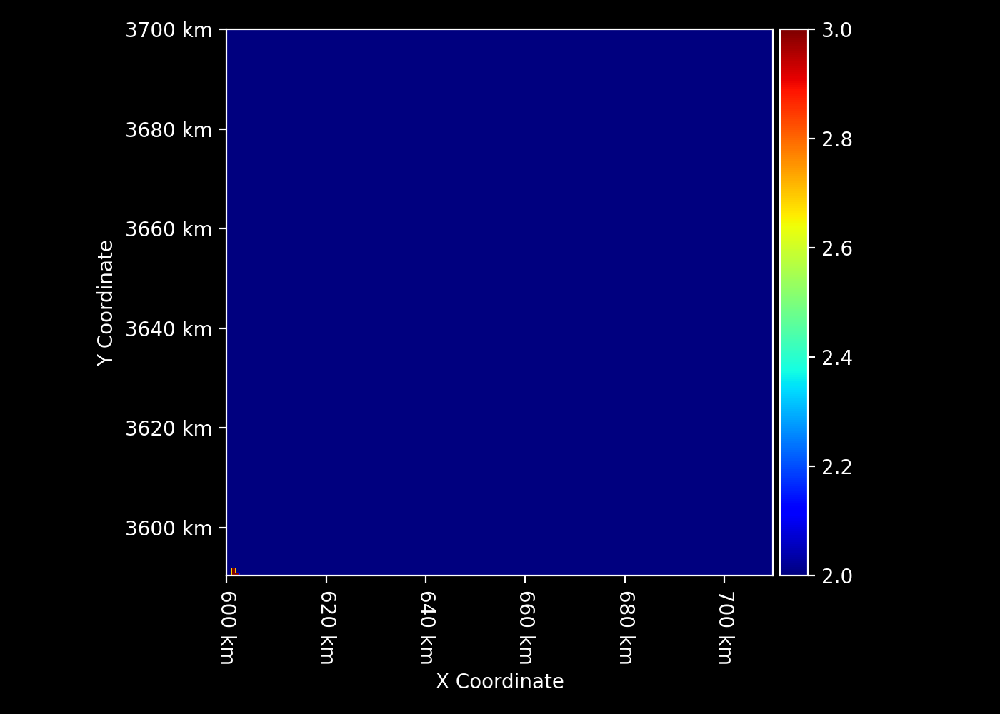

In [14]:
kg = load_koppen_geiger(ST_C.geometry)
kg

We'll use the digital elevation model (DEM) provided by ECOSTRESS, which is derived from the Shuttle Radar Topography Mission (SRTM).

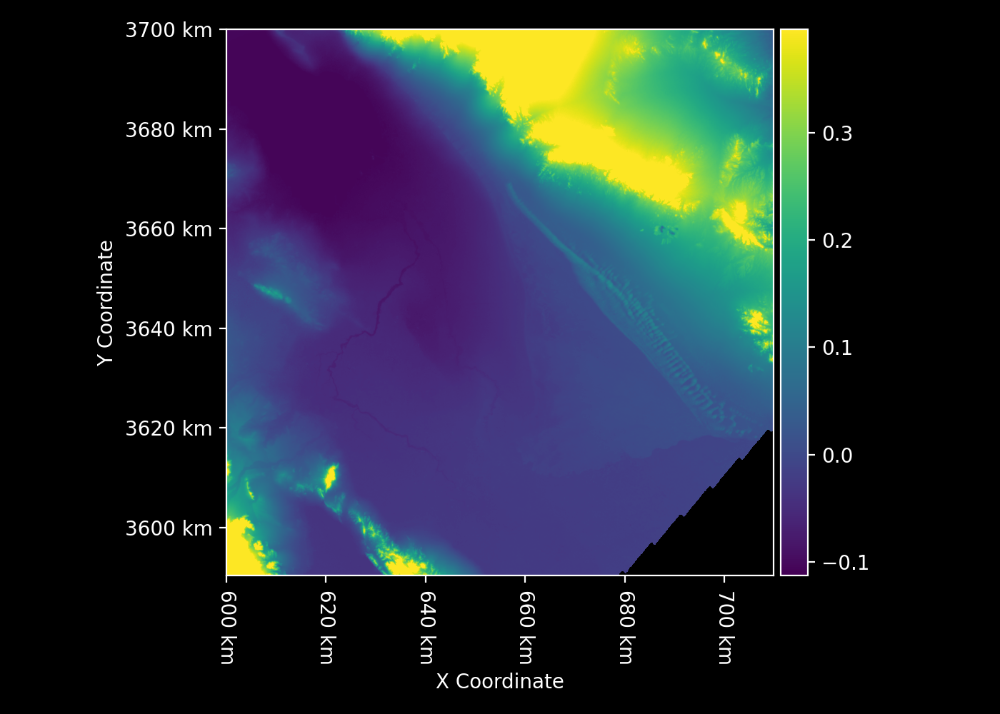

In [15]:
elevation_filename = "ECOv002_L2T_LSTE_34366_004_11SPS_20240728T204025_0712_01_height.tif"
elevation_m = rt.Raster.open(elevation_filename)
elevation_km = elevation_m / 1000
elevation_km.cmap = "viridis"
elevation_km

In [16]:
day_angle_rad = sun_angles.day_angle_rad_from_DOY(doy_solar)
solar_dec_deg = sun_angles.solar_dec_deg_from_day_angle_rad(day_angle_rad)
SZA_deg = sun_angles.SZA_deg_from_lat_dec_hour(ST_C.geometry.lat, solar_dec_deg, hour_of_day_solar)
SZA_deg

array([[19.58331727, 19.58331273, 19.58330818, ..., 19.57232504,
        19.57231554, 19.57230603],
       [19.58287844, 19.5828739 , 19.58286935, ..., 19.57188673,
        19.57187722, 19.57186772],
       [19.58243962, 19.58243508, 19.58243053, ..., 19.57144842,
        19.57143892, 19.57142941],
       ...,
       [18.90930225, 18.90929804, 18.90929382, ..., 18.89911795,
        18.89910914, 18.89910033],
       [18.90888002, 18.90887581, 18.9088716 , ..., 18.89869624,
        18.89868743, 18.89867863],
       [18.90845781, 18.9084536 , 18.90844938, ..., 18.89827454,
        18.89826574, 18.89825693]])

In [17]:
FLiES_results = process_FLiES(
    doy=doy_solar,
    albedo=albedo,
    COT=COT,
    AOT=AOT,
    vapor_gccm=vapor_gccm,
    ozone_cm=ozone_cm,
    elevation_km=elevation_km,
    SZA=SZA_deg,
    KG_climate=kg
)

76832/76832 [==============================] - 25s 320us/step


/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


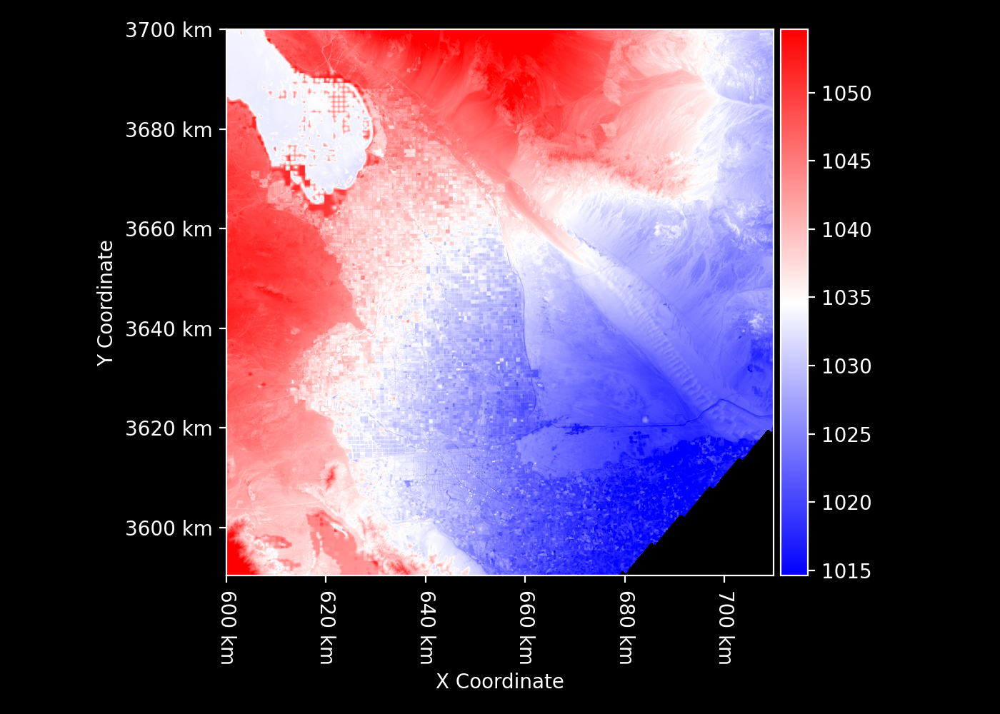

In [18]:
Rg = FLiES_results["Rg"]
Rg.cmap = "bwr"
Rg

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


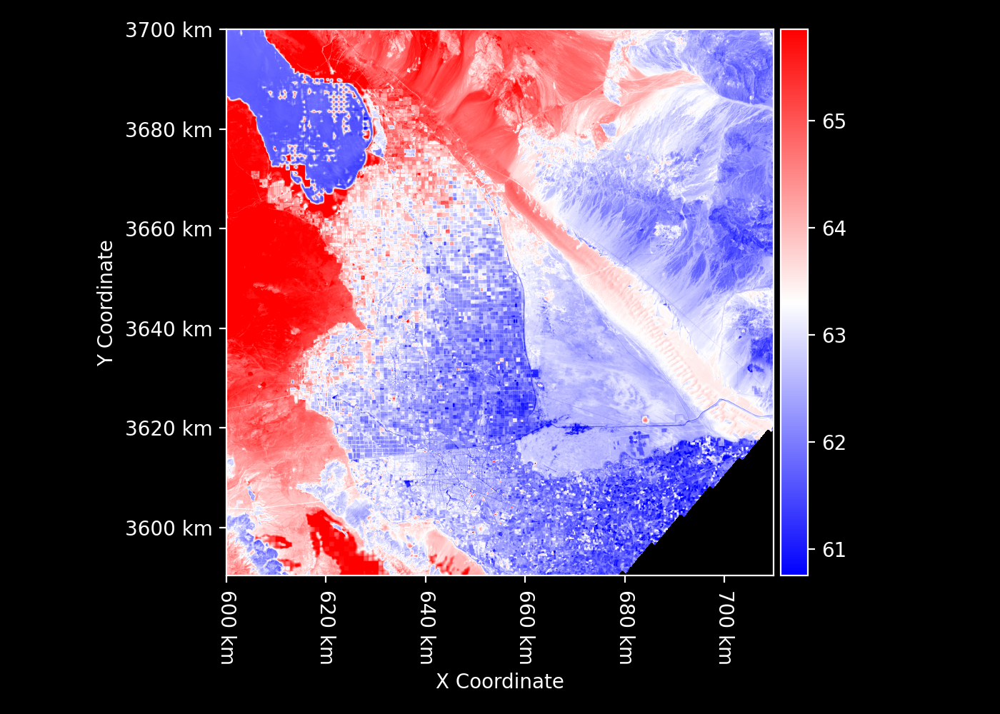

In [19]:
UV = FLiES_results["UV"]
UV.cmap = "bwr"
UV

In [20]:
VISdiff = FLiES_results["VISdiff"]
VISdir = FLiES_results["VISdir"]
NIRdiff = FLiES_results["NIRdiff"]
NIRdir = FLiES_results["NIRdir"]

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


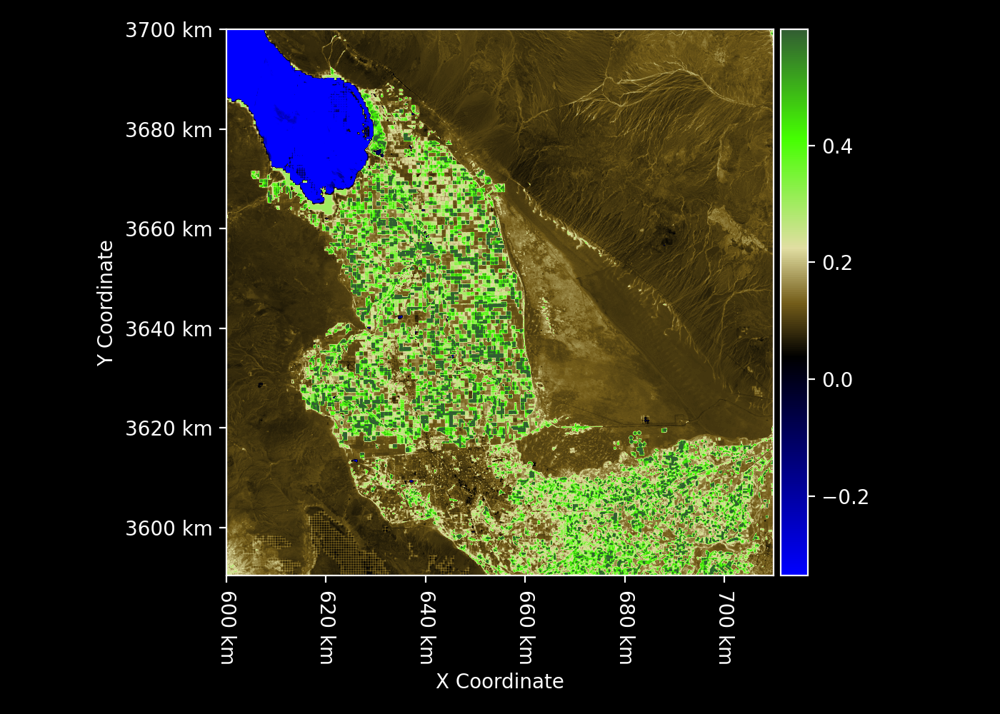

In [21]:
NDVI_filename = "ECOv002_L2T_STARS_11SPS_20240728_0712_01_NDVI.tif"
NDVI = rt. Raster.open(NDVI_filename)

NDVI_COLORMAP_ABSOLUTE = LinearSegmentedColormap.from_list(
    name="NDVI",
    colors=[
        (0, "#0000ff"),
        (0.4, "#000000"),
        (0.5, "#745d1a"),
        (0.6, "#e1dea2"),
        (0.8, "#45ff01"),
        (1, "#325e32")
    ]
)

NDVI.cmap = NDVI_COLORMAP_ABSOLUTE
NDVI

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


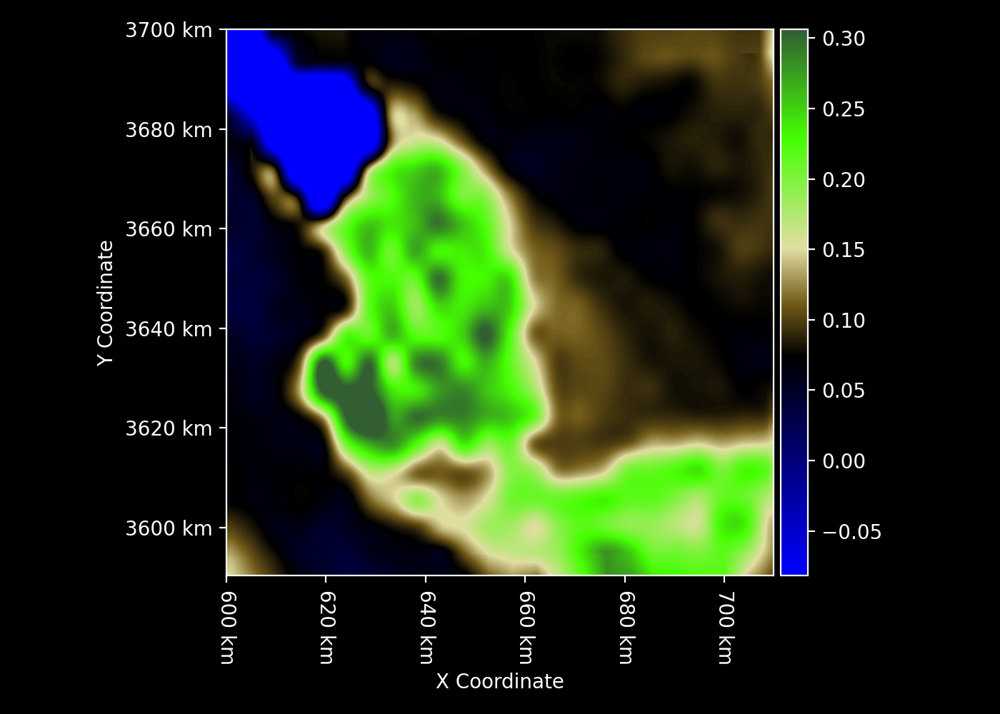

In [22]:
NDVI_minimum = load_NDVI_minimum(geometry=ST_C.geometry, resampling="cubic")
NDVI_minimum.cmap = NDVI_COLORMAP_ABSOLUTE
NDVI_minimum

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


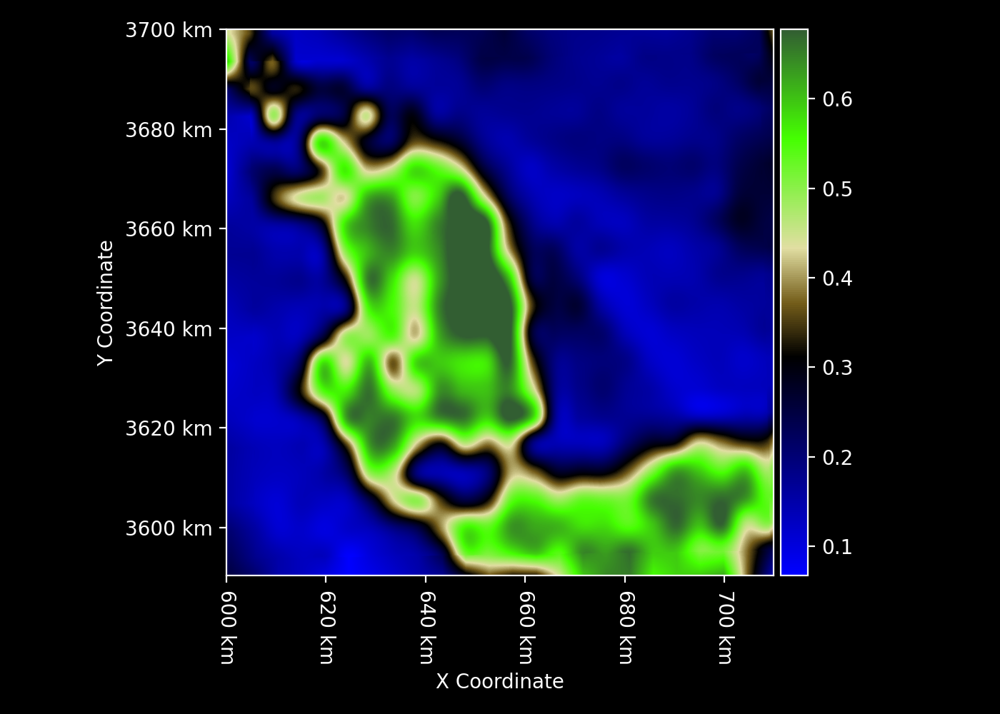

In [23]:
NDVI_maximum = load_NDVI_maximum(geometry=ST_C.geometry, resampling="cubic")
NDVI_maximum.cmap = NDVI_COLORMAP_ABSOLUTE
NDVI_maximum

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


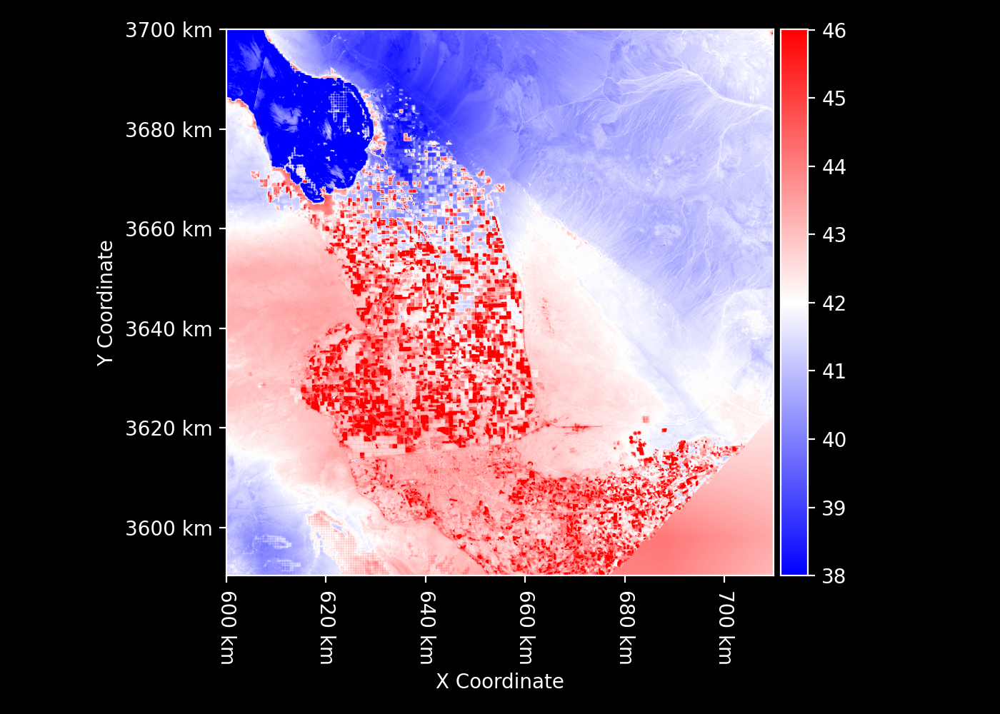

In [24]:
Ta_filename = "ECOv002_L3T_MET_34366_004_11SPS_20240728T204025_0712_01_Ta.tif"
Ta_C = rt.Raster.open(Ta_filename)
Ta_C.cmap = "bwr"
Ta_C

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


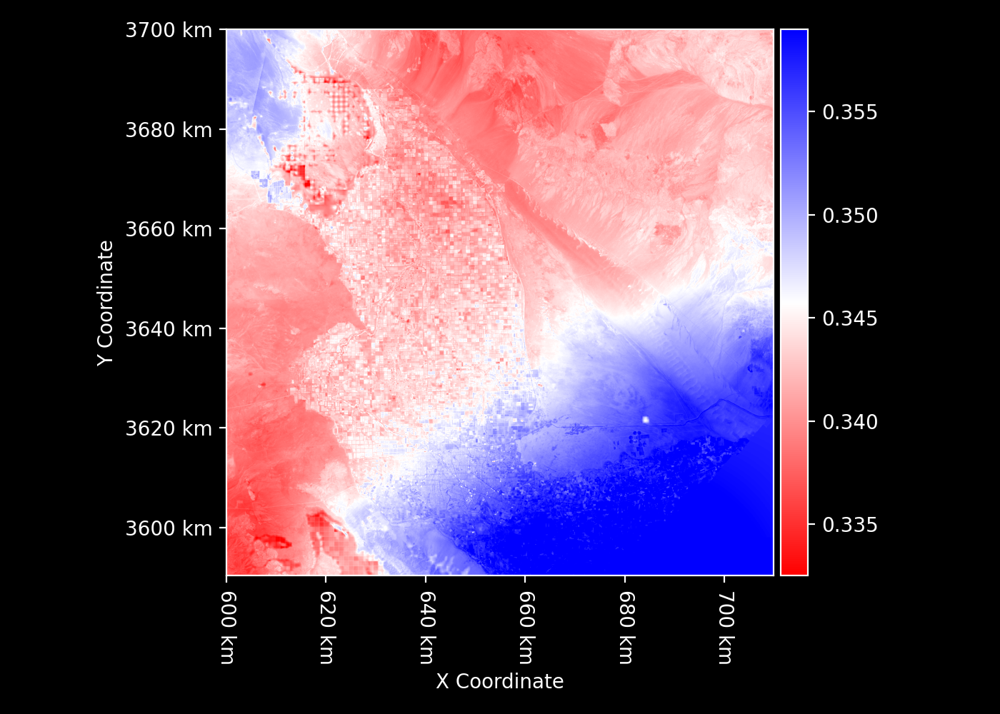

In [25]:
RH_filename = "ECOv002_L3T_MET_34366_004_11SPS_20240728T204025_0712_01_RH.tif"
RH = rt.Raster.open(RH_filename)
RH.cmap = "bwr_r"
RH

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


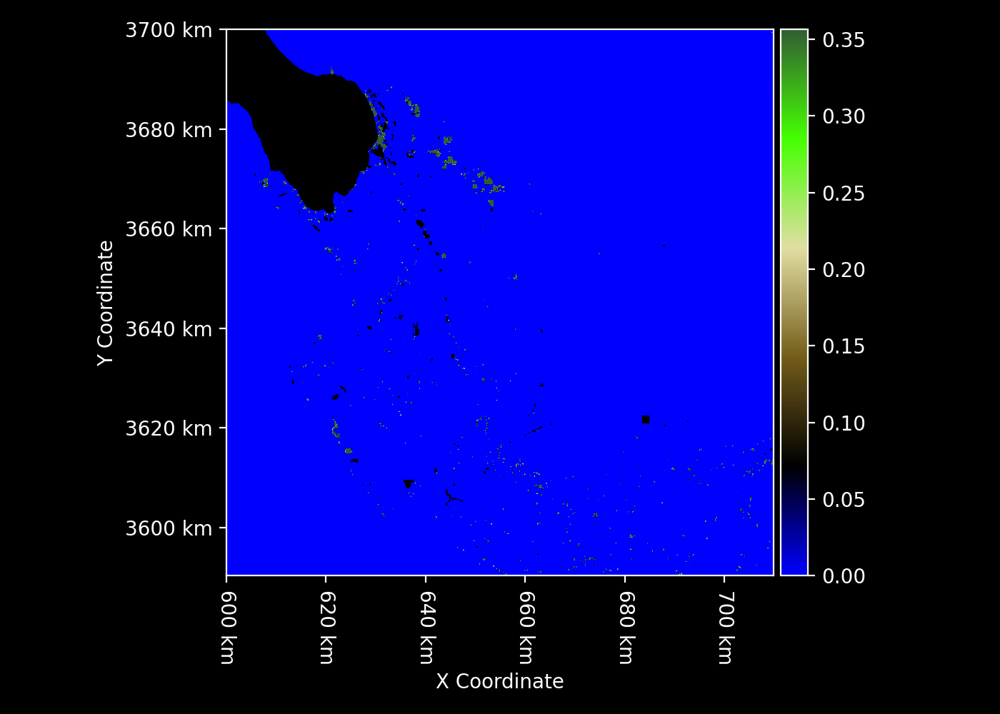

In [26]:
gedi_canopy_height = GEDICanopyHeight("~/data/L3T_L4T_static/GEDI_download")
canopy_height_meters = gedi_canopy_height.canopy_height_meters(geometry=ST_C.geometry)
canopy_height_meters

In [27]:
%%capture
wind_speed_mps = geos5fp.wind_speed(time_UTC=time_UTC, geometry=ST_C.geometry)

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


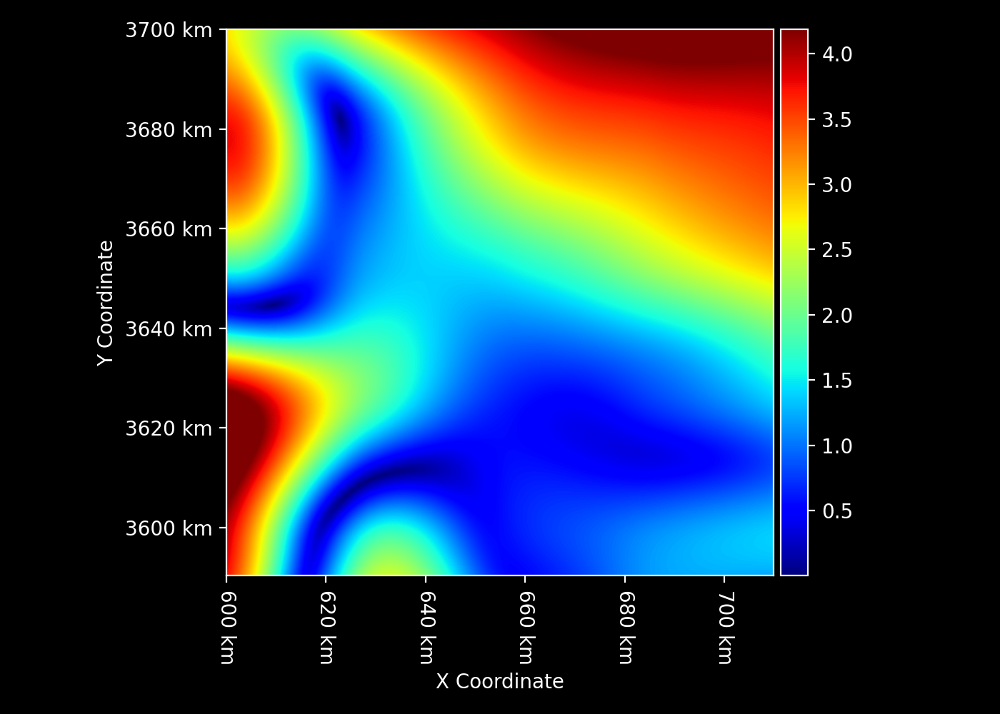

In [28]:
wind_speed_mps

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


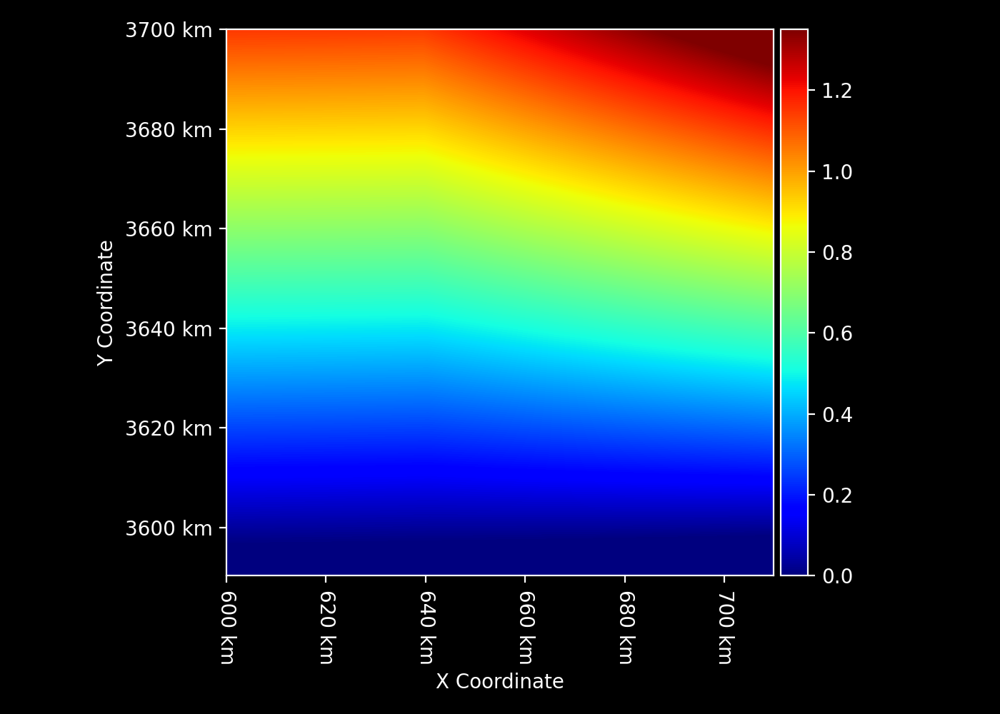

In [29]:
C4_fraction = load_C4_fraction(ST_C.geometry)
C4_fraction

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


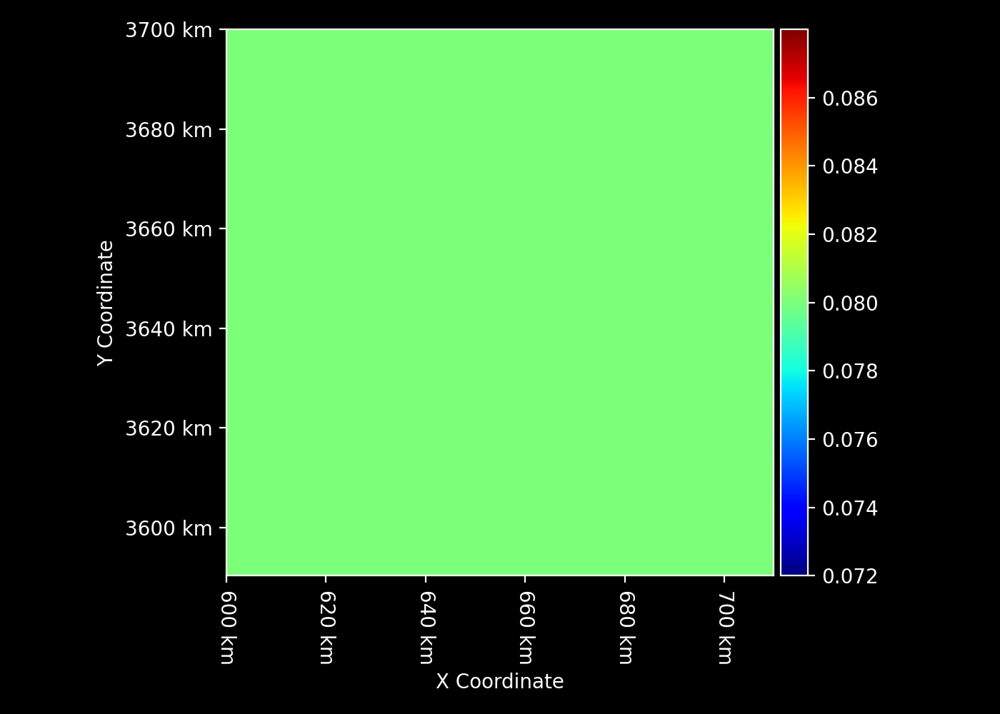

In [30]:
carbon_uptake_efficiency = load_carbon_uptake_efficiency(ST_C.geometry)
carbon_uptake_efficiency

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


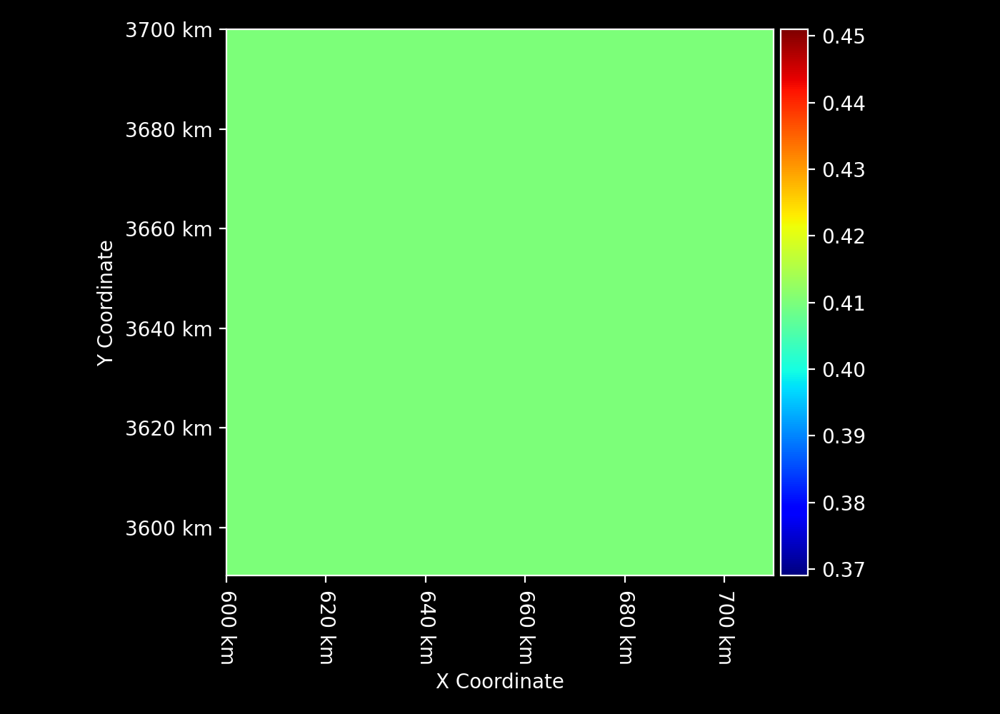

In [31]:
kn = load_kn(ST_C.geometry)
kn

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


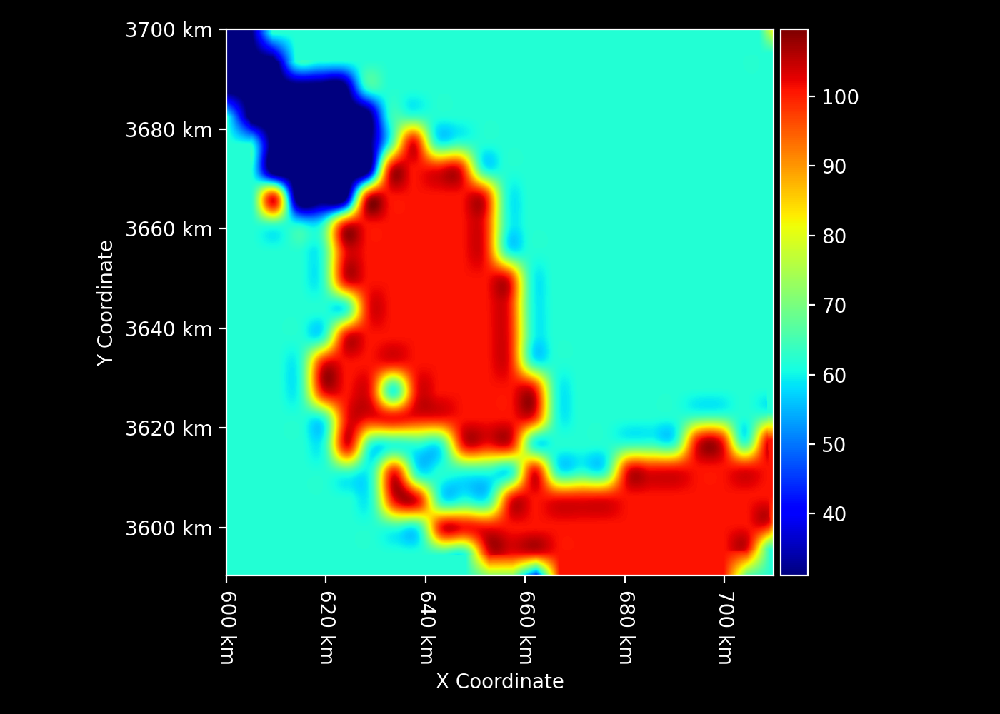

In [32]:
peakVCmax_C3 = load_peakVCmax_C3(ST_C.geometry)
peakVCmax_C3

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


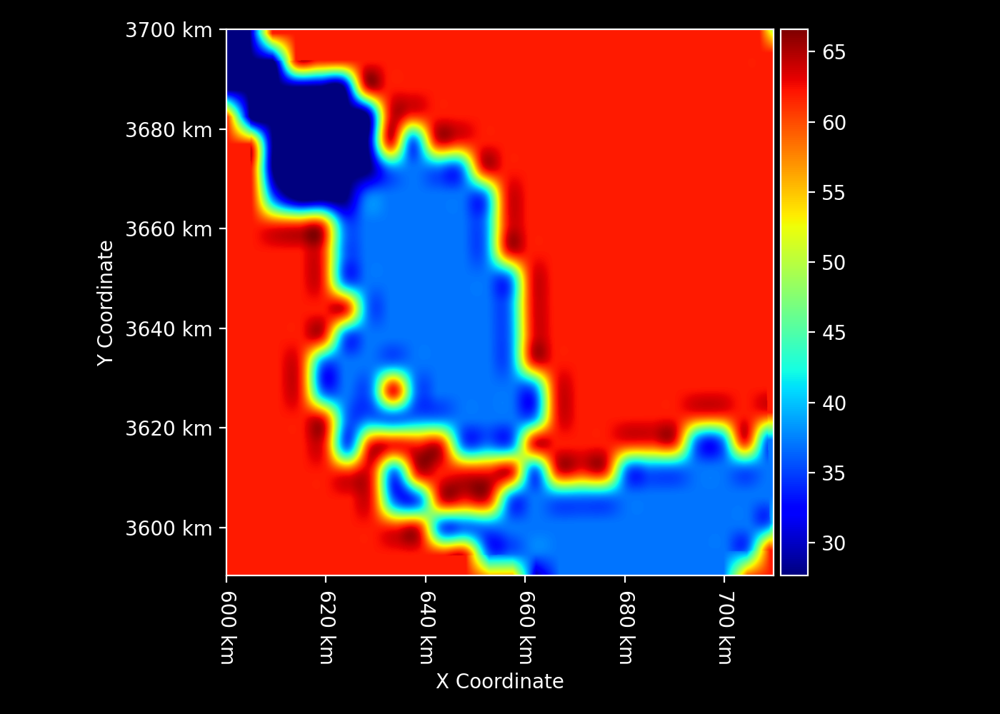

In [33]:
peakVCmax_C4 = load_peakVCmax_C4(ST_C.geometry)
peakVCmax_C4

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


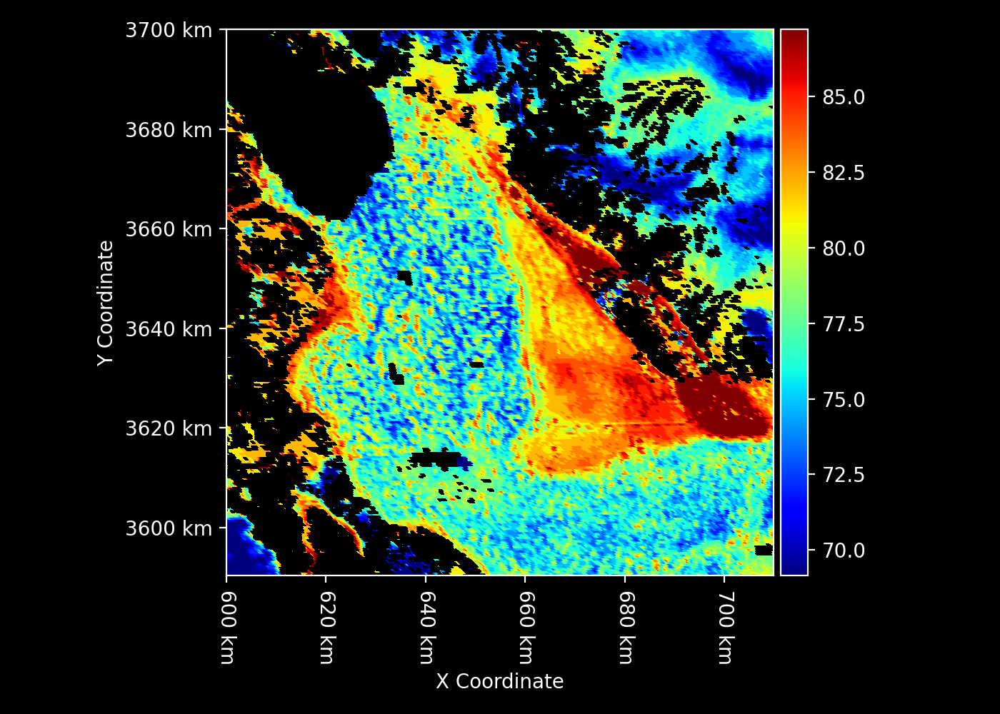

In [34]:
CI = load_clumping_index(ST_C.geometry)
CI

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


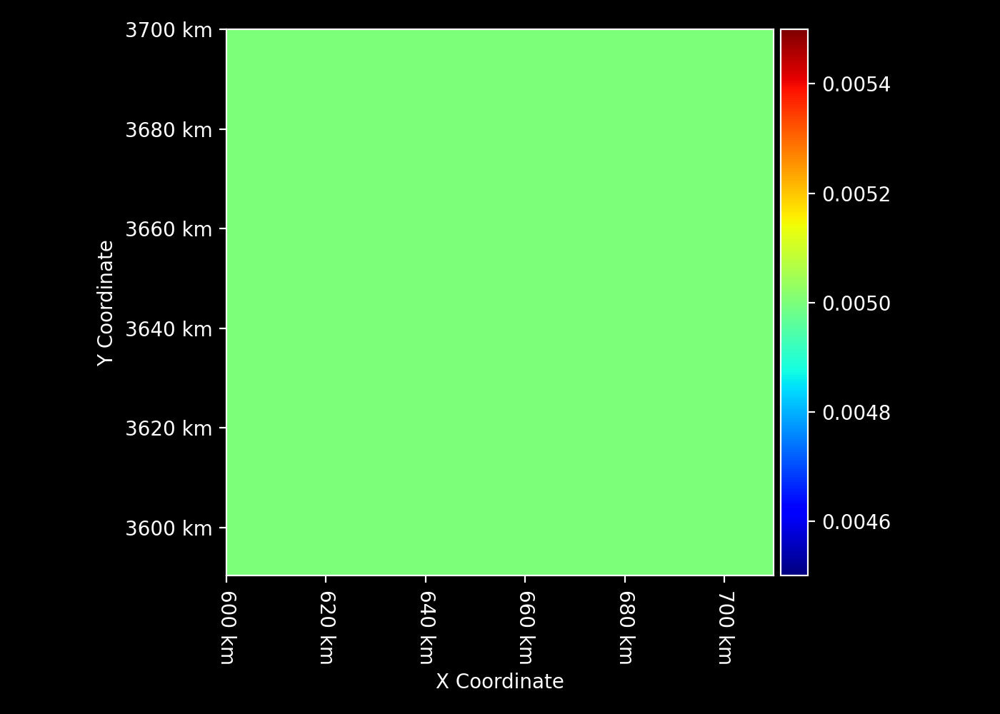

In [35]:
ball_berry_intercept_C3 = load_ball_berry_intercept_C3(ST_C.geometry)
ball_berry_intercept_C3

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


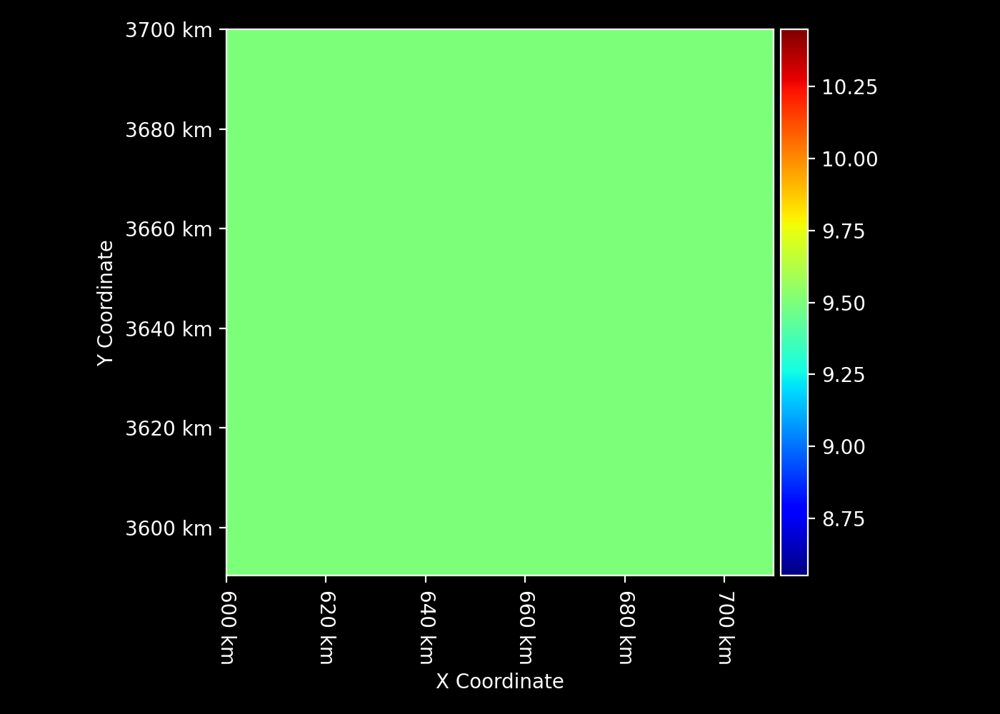

In [36]:
ball_berry_slope_C3 = load_ball_berry_slope_C3(ST_C.geometry)
ball_berry_slope_C3

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


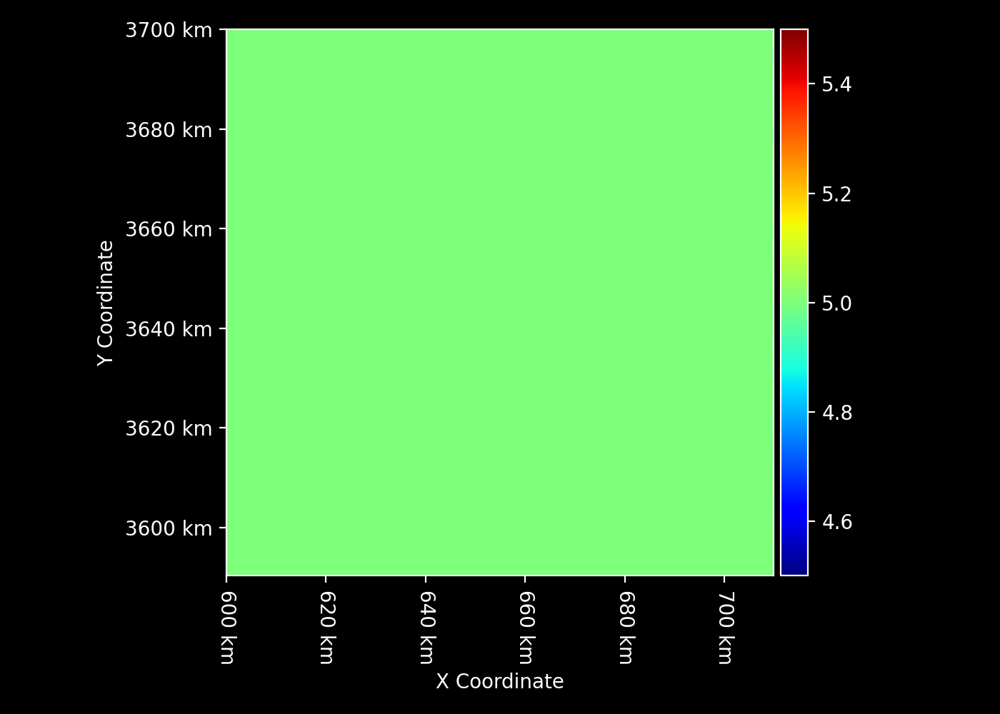

In [37]:
ball_berry_slope_C4 = load_ball_berry_slope_C4(ST_C.geometry)
ball_berry_slope_C4

In [38]:
%%capture
Ca = geos5fp.CO2SC(time_UTC=time_UTC, geometry=ST_C.geometry)

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


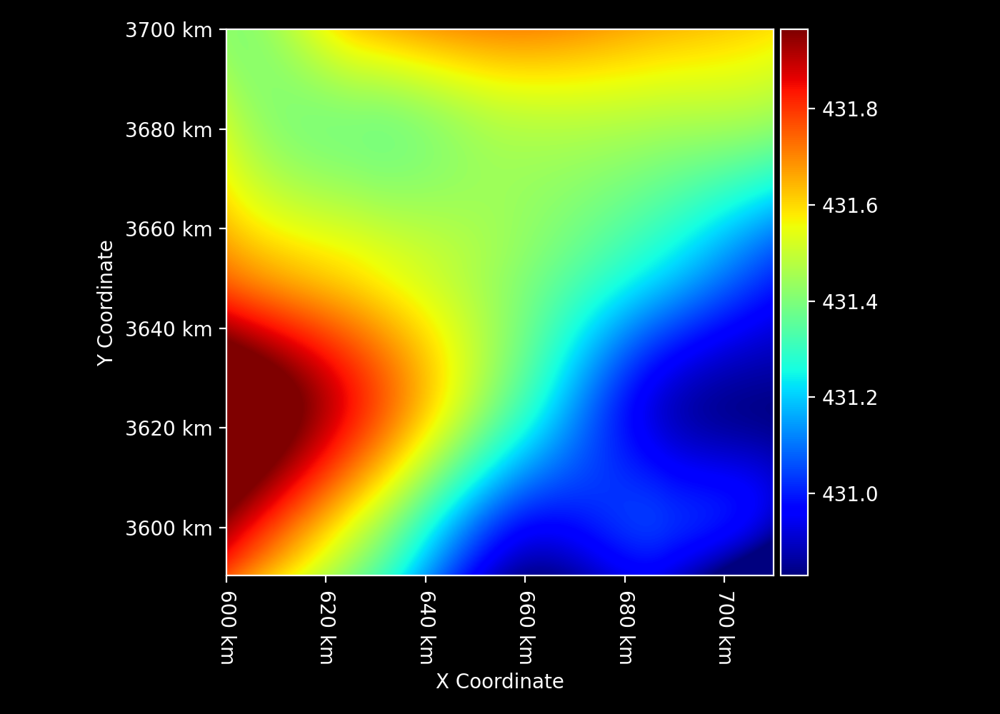

In [39]:
Ca

In [40]:
process_BESS_latlon?

Signature:
process_BESS_latlon(
    hour_of_day: Union[rasters.rasters.Raster, numpy.ndarray],
    day_of_year: Union[rasters.rasters.Raster, numpy.ndarray],
    latitude: Union[rasters.rasters.Raster, numpy.ndarray],
    longitude: Union[rasters.rasters.Raster, numpy.ndarray],
    elevation_km: Union[rasters.rasters.Raster, numpy.ndarray],
    ST_C: Union[rasters.rasters.Raster, numpy.ndarray],
    NDVI: Union[rasters.rasters.Raster, numpy.ndarray],
    NDVI_minimum: Union[rasters.rasters.Raster, numpy.ndarray],
    NDVI_maximum: Union[rasters.rasters.Raster, numpy.ndarray],
    albedo: Union[rasters.rasters.Raster, numpy.ndarray],
    Ta_C: Union[rasters.rasters.Raster, numpy.ndarray],
    RH: Union[rasters.rasters.Raster, numpy.ndarray],
    Rg: Union[rasters.rasters.Raster, numpy.ndarray],
    VISdiff: Union[rasters.rasters.Raster, numpy.ndarray],
    VISdir: Union[rasters.rasters.Raster, numpy.ndarray],
    NIRdiff: Union[rasters.rasters.Raster, numpy.ndarray],
    NIRdir: Union[r

In [41]:
BESS_results = process_BESS_latlon(
    hour_of_day=hour_of_day_solar,
    day_of_year=doy_solar,
    latitude=latitude,
    longitude=longitude,
    elevation_km=elevation_km,
    ST_C=ST_C,
    NDVI=NDVI,
    NDVI_minimum=NDVI_minimum,
    NDVI_maximum=NDVI_maximum,
    albedo=albedo,
    Ta_C=Ta_C,
    RH=RH,
    Rg=Rg,
    VISdiff=VISdiff,
    VISdir=VISdir,
    NIRdiff=NIRdiff,
    NIRdir=NIRdir,
    UV=UV,
    canopy_height_meters=canopy_height_meters,
    Ca=400,
    wind_speed_mps=wind_speed_mps,
    SZA=SZA_deg,
    canopy_temperature_C=ST_C,
    soil_temperature_C=ST_C,
    albedo_visible=albedo,
    albedo_NIR=albedo,
    C4_fraction=C4_fraction,
    carbon_uptake_efficiency=carbon_uptake_efficiency,
    kn=kn,
    ball_berry_intercept_C3=ball_berry_intercept_C3,
    ball_berry_intercept_C4=BALL_BERRY_INTERCEPT_C4,
    ball_berry_slope_C3=ball_berry_slope_C3,
    ball_berry_slope_C4=ball_berry_slope_C4,
    peakVCmax_C3=peakVCmax_C3,
    peakVCmax_C4=peakVCmax_C4,
    CI=CI
)

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


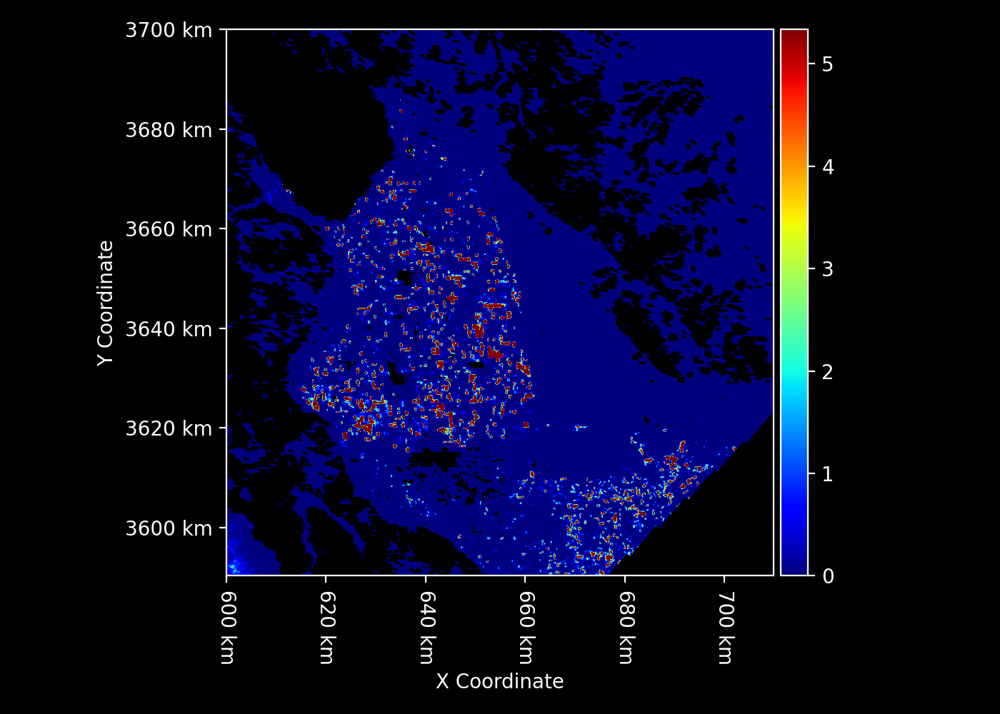

In [42]:
BESS_results["GPP"]

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


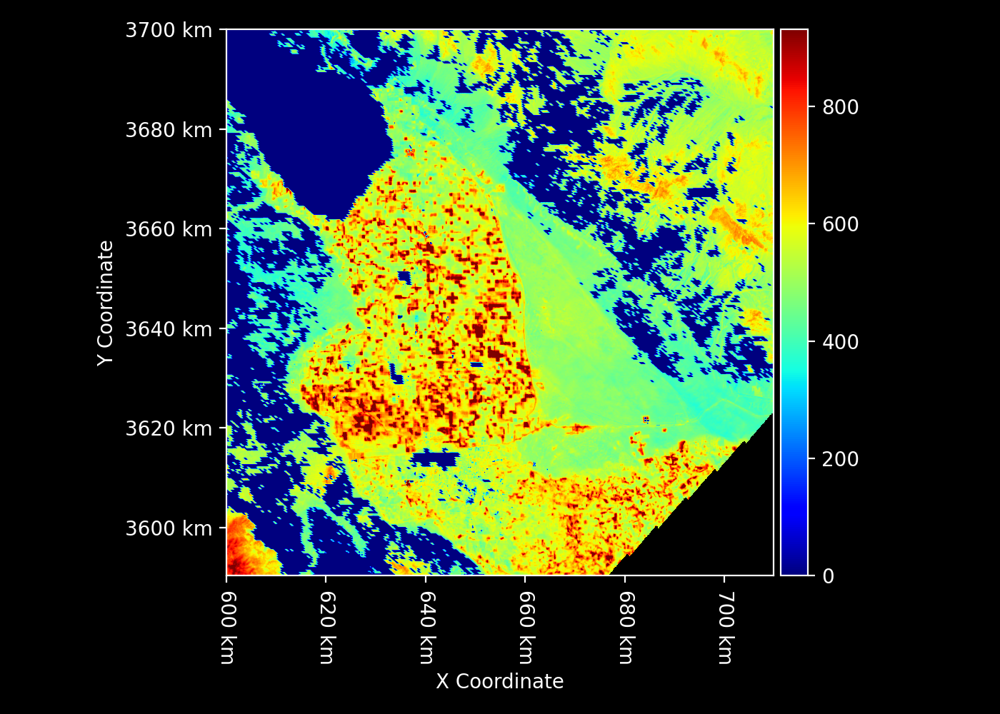

In [43]:
BESS_results["Rn"]

/opt/homebrew/Caskroom/miniforge/base/envs/BESS/lib/python3.11/site-packages/rasters/rasters.py:4390: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed in 3.10.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


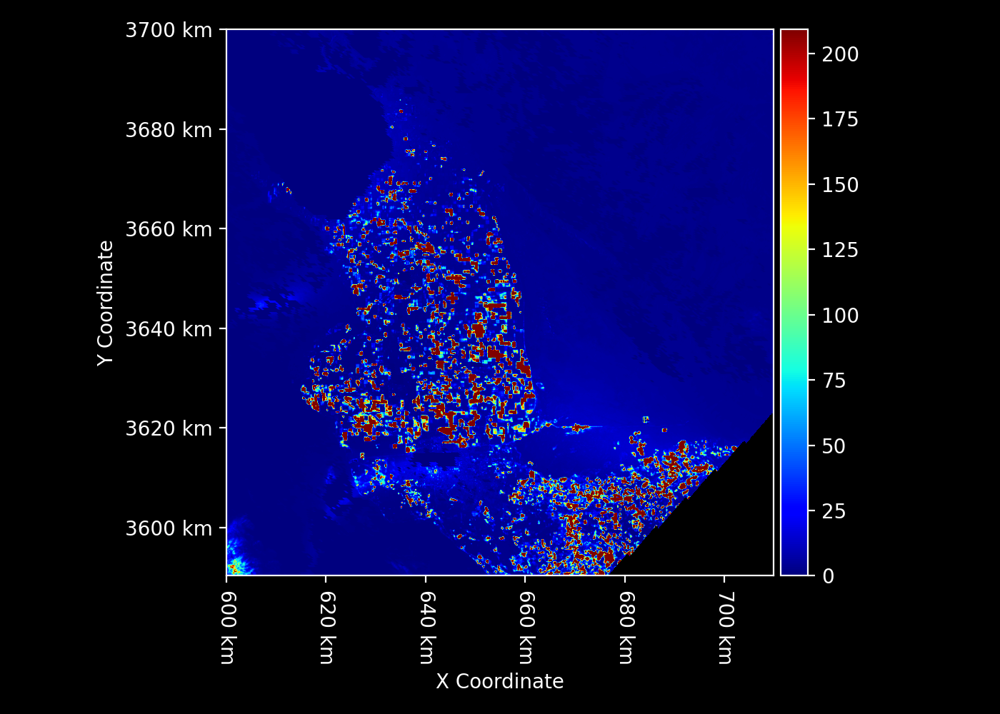

In [44]:
BESS_results["LE"]